In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import (
    InceptionResNetV2,
    ResNet50,
    InceptionV3,
    DenseNet121,
)

import numpy as np

from matplotlib import *
from matplotlib import pyplot
from matplotlib.pyplot import *

import cv2
from PIL import Image

import glob 
import os
import sys

from skimage import metrics
from skimage.metrics import structural_similarity as ssim

# from modelscript import define_generator, define_discriminator



# This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
tf.config.experimental.list_physical_devices('GPU')
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

NOISE_FLOOR = 30

def reduce_noise(noisy_img, noise_floor=NOISE_FLOOR):
    clean_img = np.array(noisy_img)
    clean_img[noisy_img < NOISE_FLOOR] = 0
    return clean_img



#check current directory and import images
print(os.getcwd()) 
filelist=glob.glob('/kaggle/input/dataset-01/DS/train/meningioma_cropped/*.jpg')
train_size = len(filelist)
# images0=np.array([np.array( ) for i in filelist[0:train_size]])
images0 = []
for i in filelist[0:train_size]:
    image = Image.open(i)
    image = np.array(image,dtype="float32")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = reduce_noise(image)
    image = cv2.resize(image, (128,128))
    images0.append(image)
images0 = np.array(images0)
print('training images',images0.shape)

filelist=glob.glob('/kaggle/input/dataset-01/DS/val/meningioma_cropped/*.jpg')
test_size = len(filelist)
images1 = []
for i in filelist[0:test_size]:
    image = Image.open(i)
    image = np.array(image,dtype="float32")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = reduce_noise(image)
    image = cv2.resize(image, (128,128))
    images1.append(image)
images1 = np.array(images1)
print('training images',images1.shape)

# filelist=glob.glob('/kaggle/input/dataset-v01/Dataset_V01/Dataset_V01/val/glioma/*.jpg')
# val_size = len(filelist)
# images2 = []
# for i in filelist[0:val_size]:
#     image = Image.open(i)
#     image = np.array(image,dtype="float32")
#     image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#     image = cv2.resize(image, (224,224))
#     images2.append(image)
# images2 = np.array(images2)
# print('training images',images2.shape)


#concatenate all images into one array called "images"
images=np.concatenate((images0,images1), axis=0)
print(images.shape)

Num GPUs Available:  1
/kaggle/working
training images (495, 128, 128)
training images (106, 128, 128)
(601, 128, 128)


In [ ]:
# data_location = workspace + "data/cond_data.npy"

NUM_EPOCHS = 100
LATENT_DIM = 100
INPUT_SHAPE = (128, 128, 1)
LEARNING_RATE = 0.0002
MOMENTUM = 0.5
BATCH_SIZE = 128

In [3]:
###defining the generator###
def define_generator():

    model = tf.keras.Sequential()

    n_nodes = 64*8*8
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((8, 8, 64)))
    # 8, 8, 64
    
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # 16, 16, 128

    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # 32, 32, 128

    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # 64, 64, 128

    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # 128, 128, 128

    model.add(Conv2D(1, (16,16), activation='tanh', padding='same'))
    model.summary()
    return model

In [4]:
define_generator()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 262144)            33816576  
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 262144)            0         
                                                                 
 reshape (Reshape)           (None, 32, 32, 256)       0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 64, 64, 256)      1048576   
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 64, 64, 256)      1024      
 ormalization)                                                   
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 256)       0

In [5]:

###defining the discriminator###
def define_discriminator(input=(128,128,1)):

    model = tf.keras.Sequential()
    
        # 128, 128, 1
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    # 64, 64, 128
    
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # 32, 32, 128
    
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # 16, 16, 128

    model.add(Conv2D(64, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # 8, 8, 64

    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    model.summary()
    return model


In [6]:
define_discriminator()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        544       
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 64, 64, 32)        0         
                                                                 
 dropout (Dropout)           (None, 64, 64, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 64)        32832     
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 dropout_1 (Dropout)         (None, 32, 32, 64)        0         
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 128)      

In [7]:
#Preprocessing
#normalise pixel values from [0,255] to [-1,1]
images=(images - 127.5) / 127.5

#make into 4D array
images=images[:,:,:,np.newaxis]

#check shape
print(images.shape)

(601, 128, 128, 1)


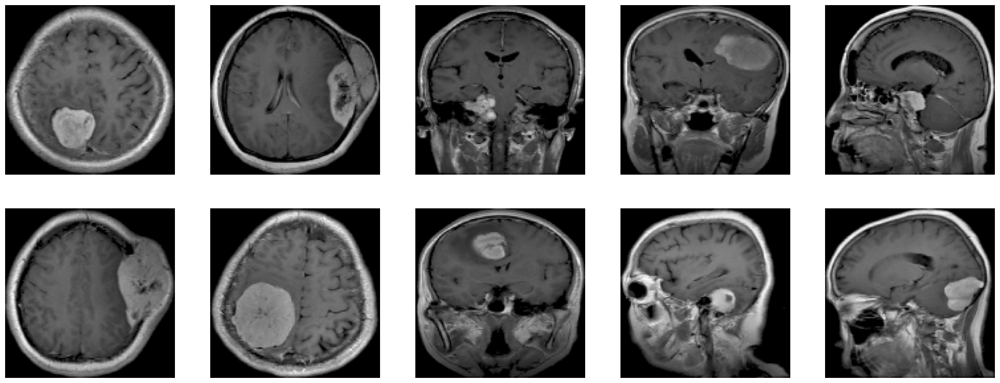

In [8]:
pyplot.figure(figsize=(25,25))
for i in range(10):
    # define subplot
    pyplot.subplot(5, 5, 1 + i)
    # turn off axis
    pyplot.axis('off')
    # plot raw pixel data
    pyplot.imshow(images[i,:,:,0],cmap="gray")
pyplot.show()


In [9]:
g_model = define_generator()

d_model = define_discriminator()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 262144)            33816576  
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 262144)            0         
                                                                 
 reshape_1 (Reshape)         (None, 32, 32, 256)       0         
                                                                 
 conv2d_transpose_2 (Conv2DT  (None, 64, 64, 256)      1048576   
 ranspose)                                                       
                                                                 
 batch_normalization_2 (Batc  (None, 64, 64, 256)      1024      
 hNormalization)                                                 
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 64, 64, 256)      

In [10]:
########Visualising generated images############
#choose the number of samples to visualise
n_samples=5
#define number of points in latent space
latent_dim= 128

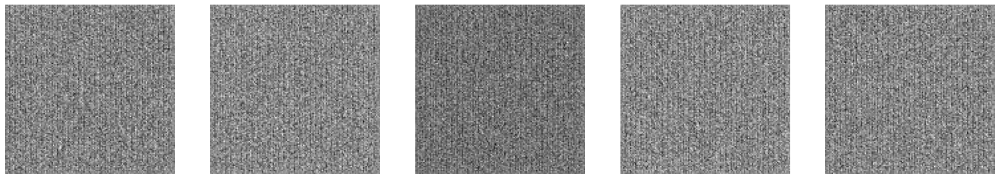

In [11]:
#generate noise according to number of samples specified with latent_dim previously defined as 256
noise = tf.random.normal([n_samples, latent_dim])

#generate fake images
x_fake = g_model(noise,training=False)
pyplot.figure(figsize=(25,25))
for i in range(n_samples):
    # define subplot
    pyplot.subplot(5, 5, 1 + i)
    pyplot.axis('off')
    # plot single image
    pyplot.imshow(x_fake[i, :, :,0],cmap='gray')
pyplot.show()
pyplot.close()


In [12]:
#Define loss functions
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [13]:
#Define optimisers

generator_optimiser = tf.keras.optimizers.Adam(0.0002, 0.6)

discriminator_optimiser = tf.keras.optimizers.Adam(0.0001, 0.6)

In [15]:
#Define training function
batch_size = 16

#Training function
@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = g_model(noise, training=True)

        real_output = d_model(images, training=True)
        fake_output = d_model(generated_images, training=True)

        g_loss = generator_loss(fake_output)
        d_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(g_loss, g_model.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(d_loss, d_model.trainable_variables)

    generator_optimiser.apply_gradients(zip(gradients_of_generator, g_model.trainable_variables))
    discriminator_optimiser.apply_gradients(zip(gradients_of_discriminator, d_model.trainable_variables))
    return d_loss, g_loss

In [16]:
#Define training loop
EPOCHS = 1000
batch_per_epoch=np.round(images.shape[0]/batch_size)

#number of sample images to display
n_samples=5

total_size=images.shape[0]


# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(total_size).batch(batch_size)


In [17]:
def train(dataset, epochs):
    d_hist = []
    g_hist = []
    for epoch in range(epochs):
        count=0
        for image_batch in dataset:
            d_loss,g_loss=train_step(image_batch)
            d_hist.append(d_loss)
            g_hist.append(g_loss)
            if (count) % 25 == 0:
                print('>%d, %d/%d, d=%.8f, g=%.8f' % (epoch, count, batch_per_epoch, d_loss, g_loss))
            if (count) % 350 == 0:
                noise = tf.random.normal([n_samples, latent_dim])
                x_fake = g_model(noise,training=False)
                pyplot.figure(figsize=(25,25))
                for i in range(n_samples):
                    # define subplot
                    pyplot.subplot(5, 5, 1 + i)
                    pyplot.axis('off')
                    # plot single image
                    pyplot.imshow(x_fake[i, :, :,0],cmap='gray')
                if epoch % 40 ==0:
                    pyplot.savefig('/kaggle/working/0511 Epoch {} batch {}.png'.format(epoch,count))
                    pyplot.show()
                
                pyplot.close()
                
            count=count+1
    # if epoch == 100:
    #     filename = '/kaggle/working/generator_model_%03d.h5' % (epoch) 
    #     g_model.save(filename)
    if epoch == 200:
        #         just save one model version per epoch
        filename = '/kaggle/working/generator_model_%03d.h5' % (epoch) 
        g_model.save(filename)
    if epoch == 400:
        #         just save one model version per epoch
        filename = '/kaggle/working/generator_model_%03d.h5' % (epoch) 
        g_model.save(filename)
    # if epoch == 600:
    #     #         just save one model version per epoch
    #     filename = '/kaggle/working/generator_model_%03d.h5' % (epoch) 
    #     g_model.save(filename)
    # if epoch == 800:
    #     #         just save one model version per epoch
    #     filename = '/kaggle/working/generator_model_%03d.h5' % (epoch) 
    #     g_model.save(filename)
    if epoch == 900:
        #         just save one model version per epoch
        filename = '/kaggle/working/generator_model_%03d.h5' % (epoch) 
        g_model.save(filename)
    if epoch == 999:
        #         just save one model version per epoch
        filename = '/kaggle/working/generator_model_%03d.h5' % (epoch) 
        g_model.save(filename)

    return d_hist,g_hist, g_model

2023-02-25 23:17:11.530598: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_3/dropout_4/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


>0, 0/38, d=1.41148925, g=0.69164836


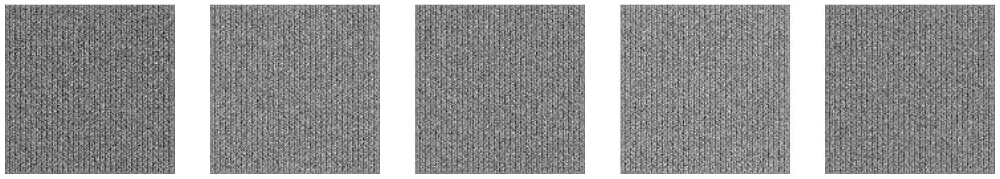

>0, 25/38, d=1.15893888, g=1.44082189


2023-02-25 23:17:19.578903: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_3/dropout_4/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


>1, 0/38, d=1.04739738, g=1.41444540
>1, 25/38, d=1.10664177, g=1.49649847
>2, 0/38, d=1.06365263, g=1.88237131
>2, 25/38, d=1.66679800, g=0.39353913
>3, 0/38, d=1.51241481, g=0.46389711
>3, 25/38, d=1.34645987, g=0.54241008
>4, 0/38, d=1.35794067, g=0.53897750
>4, 25/38, d=1.30790055, g=0.59223527
>5, 0/38, d=1.27883375, g=0.68210983
>5, 25/38, d=1.34927273, g=0.70597088
>6, 0/38, d=1.28704715, g=0.64406860
>6, 25/38, d=1.36565232, g=0.70947093
>7, 0/38, d=1.28417563, g=0.63852942
>7, 25/38, d=1.01364434, g=1.99344683
>8, 0/38, d=1.34188628, g=0.88162017
>8, 25/38, d=1.13787258, g=0.60594076
>9, 0/38, d=1.16766071, g=0.63370919
>9, 25/38, d=1.13948405, g=2.27945995
>10, 0/38, d=1.25740385, g=0.81356245
>10, 25/38, d=1.31521559, g=0.72078955
>11, 0/38, d=1.21515107, g=0.69928157
>11, 25/38, d=1.37646759, g=0.67575872
>12, 0/38, d=1.25844955, g=0.72685707
>12, 25/38, d=1.33763385, g=0.75141239
>13, 0/38, d=1.29044771, g=0.69224668
>13, 25/38, d=1.34410894, g=0.79181468
>14, 0/38, d=1.30

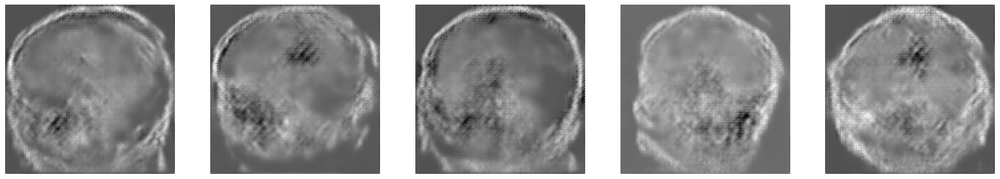

>40, 25/38, d=1.25737119, g=0.80579907
>41, 0/38, d=1.22545528, g=0.93266904
>41, 25/38, d=1.14089012, g=0.99471247
>42, 0/38, d=1.49447167, g=0.44256145
>42, 25/38, d=1.43260193, g=0.73634094
>43, 0/38, d=1.29922545, g=0.95876408
>43, 25/38, d=1.22690332, g=0.68882692
>44, 0/38, d=1.42407322, g=0.64227521
>44, 25/38, d=1.31955838, g=0.57344216
>45, 0/38, d=1.31101775, g=0.70490879
>45, 25/38, d=1.18423295, g=0.86234236
>46, 0/38, d=1.24074244, g=0.94320679
>46, 25/38, d=1.19259953, g=0.94646072
>47, 0/38, d=1.18167293, g=0.83603799
>47, 25/38, d=1.46282029, g=0.67096782
>48, 0/38, d=1.28962910, g=0.81162846
>48, 25/38, d=1.37996578, g=0.69570315
>49, 0/38, d=1.32036066, g=0.59234047
>49, 25/38, d=1.30204797, g=0.82795858
>50, 0/38, d=1.27967286, g=0.70337212
>50, 25/38, d=1.27258134, g=0.77148271
>51, 0/38, d=1.33572197, g=0.67639357
>51, 25/38, d=1.25450432, g=0.69622982
>52, 0/38, d=1.32758677, g=0.78886282
>52, 25/38, d=1.41119909, g=0.65004253
>53, 0/38, d=1.32354617, g=0.60572630

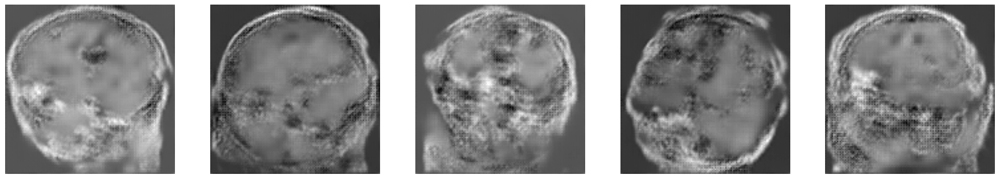

>80, 25/38, d=1.30573642, g=0.63939118
>81, 0/38, d=1.35262656, g=0.69012082
>81, 25/38, d=1.38232064, g=0.69771409
>82, 0/38, d=1.36052465, g=0.83623964
>82, 25/38, d=1.39127624, g=0.76176959
>83, 0/38, d=1.21569300, g=0.64743912
>83, 25/38, d=1.42214799, g=0.65150344
>84, 0/38, d=1.23847282, g=0.67055082
>84, 25/38, d=1.35447049, g=0.84399861
>85, 0/38, d=1.23952568, g=0.75476110
>85, 25/38, d=1.35600948, g=0.76277220
>86, 0/38, d=1.32242632, g=0.72511864
>86, 25/38, d=1.25398266, g=0.68266040
>87, 0/38, d=1.30602574, g=0.67294919
>87, 25/38, d=1.34725761, g=0.81184208
>88, 0/38, d=1.32129586, g=0.66390306
>88, 25/38, d=1.26617110, g=0.69968063
>89, 0/38, d=1.28730619, g=0.85929954
>89, 25/38, d=1.23687434, g=0.75923353
>90, 0/38, d=1.21725273, g=0.86484957
>90, 25/38, d=1.17816234, g=0.88267660
>91, 0/38, d=1.25069427, g=0.55509543
>91, 25/38, d=1.34579372, g=0.87146020
>92, 0/38, d=1.20415092, g=0.77562213
>92, 25/38, d=1.21058547, g=0.81369990
>93, 0/38, d=1.34365141, g=0.99641633

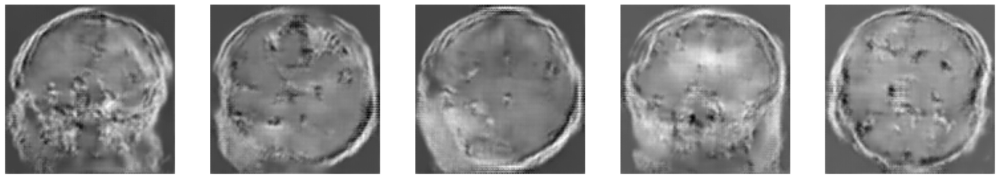

>120, 25/38, d=1.24933898, g=0.54008108
>121, 0/38, d=1.08629394, g=0.78240788
>121, 25/38, d=0.58765674, g=1.69108295
>122, 0/38, d=0.91767108, g=0.92509812
>122, 25/38, d=1.18363345, g=1.55417681
>123, 0/38, d=0.82168734, g=1.01201236
>123, 25/38, d=0.44251505, g=2.49169540
>124, 0/38, d=1.25709379, g=0.52560616
>124, 25/38, d=1.00636077, g=1.08391452
>125, 0/38, d=1.27575910, g=0.63545597
>125, 25/38, d=1.12582135, g=1.10747528
>126, 0/38, d=1.52053034, g=0.41191524
>126, 25/38, d=1.18472266, g=1.07660294
>127, 0/38, d=0.53628039, g=9.68826866
>127, 25/38, d=0.98508161, g=1.07030392
>128, 0/38, d=0.90800136, g=1.12762070
>128, 25/38, d=1.10699224, g=2.04827762
>129, 0/38, d=1.16981435, g=0.79720628
>129, 25/38, d=1.01522088, g=0.74584687
>130, 0/38, d=0.67937636, g=1.54472446
>130, 25/38, d=0.80658913, g=1.00914001
>131, 0/38, d=1.08701229, g=0.91330516
>131, 25/38, d=1.41854906, g=0.81639510
>132, 0/38, d=0.86030877, g=1.00051725
>132, 25/38, d=1.25352073, g=0.78529841
>133, 0/38, 

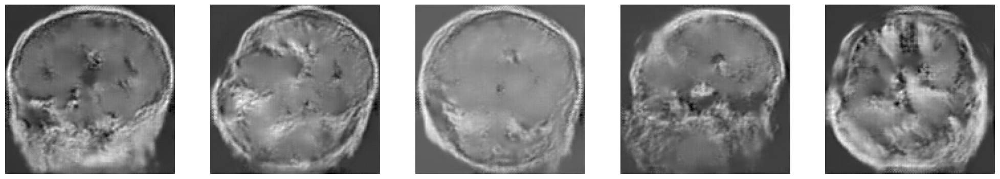

>160, 25/38, d=1.17576647, g=0.88341212
>161, 0/38, d=1.17762446, g=0.84778118
>161, 25/38, d=1.22124922, g=0.77760249
>162, 0/38, d=1.06805801, g=0.71780336
>162, 25/38, d=1.31823730, g=0.91778862
>163, 0/38, d=1.29514670, g=0.89534009
>163, 25/38, d=1.21538305, g=0.92534298
>164, 0/38, d=1.28398943, g=0.92810833
>164, 25/38, d=1.02814221, g=1.10606265
>165, 0/38, d=1.30102694, g=1.17358446
>165, 25/38, d=1.04263926, g=0.97691143
>166, 0/38, d=1.21558952, g=0.96618962
>166, 25/38, d=1.25783682, g=0.69427061
>167, 0/38, d=1.08817291, g=0.96093297
>167, 25/38, d=1.13898635, g=0.96983993
>168, 0/38, d=1.31195867, g=1.02514708
>168, 25/38, d=1.38221169, g=1.10987568
>169, 0/38, d=1.18676448, g=0.93522978
>169, 25/38, d=1.15262175, g=1.00368202
>170, 0/38, d=1.14941764, g=0.70366699
>170, 25/38, d=1.20898533, g=1.02604854
>171, 0/38, d=1.17305398, g=0.81050402
>171, 25/38, d=1.51775491, g=0.53416348
>172, 0/38, d=1.15719783, g=0.82738638
>172, 25/38, d=1.04978943, g=0.92723429
>173, 0/38, 

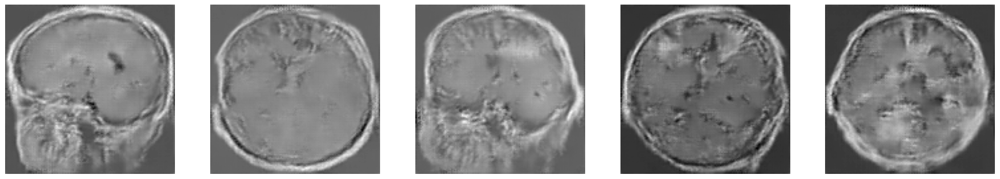

>200, 25/38, d=1.13935852, g=0.62209398
>201, 0/38, d=0.90536904, g=4.01118946
>201, 25/38, d=0.57582480, g=4.22033787
>202, 0/38, d=0.62957227, g=2.02541471
>202, 25/38, d=1.18148744, g=0.63779926
>203, 0/38, d=0.85762972, g=1.60489464
>203, 25/38, d=1.23229289, g=0.57813948
>204, 0/38, d=1.20287108, g=1.13178706
>204, 25/38, d=0.82960689, g=1.26985383
>205, 0/38, d=1.16420019, g=0.66012073
>205, 25/38, d=1.14324605, g=0.89928758
>206, 0/38, d=1.05171609, g=1.03311718
>206, 25/38, d=1.02744138, g=1.51583552
>207, 0/38, d=0.96012944, g=1.30851281
>207, 25/38, d=1.35511625, g=0.72060490
>208, 0/38, d=0.87226361, g=1.56855237
>208, 25/38, d=1.17260718, g=1.37874079
>209, 0/38, d=1.29669929, g=0.85329354
>209, 25/38, d=1.00217402, g=0.81666839
>210, 0/38, d=0.92846107, g=1.07064605
>210, 25/38, d=1.12409079, g=0.78950644
>211, 0/38, d=0.89228415, g=0.95498049
>211, 25/38, d=0.87249827, g=1.30233002
>212, 0/38, d=0.82270098, g=1.49309826
>212, 25/38, d=0.73368943, g=1.26026750
>213, 0/38, 

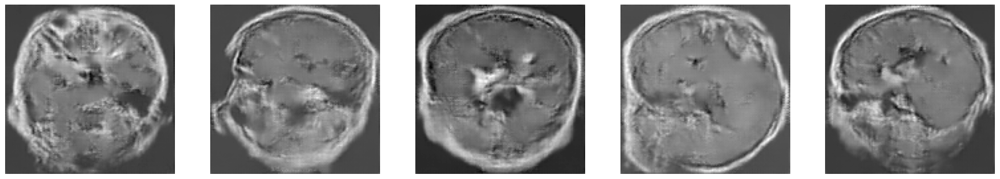

>240, 25/38, d=1.09336627, g=0.86829931
>241, 0/38, d=0.65809613, g=1.29270411
>241, 25/38, d=0.83015132, g=1.39030790
>242, 0/38, d=1.22099483, g=0.51043493
>242, 25/38, d=1.29658270, g=0.95581073
>243, 0/38, d=0.87563097, g=0.95581073
>243, 25/38, d=1.02828574, g=0.87084657
>244, 0/38, d=1.03767705, g=1.35521817
>244, 25/38, d=0.94434184, g=1.19041896
>245, 0/38, d=0.85692233, g=1.16146040
>245, 25/38, d=0.89061368, g=1.19641900
>246, 0/38, d=0.91098368, g=1.09114289
>246, 25/38, d=0.98299241, g=1.49834847
>247, 0/38, d=1.28942418, g=0.76984346
>247, 25/38, d=1.28578484, g=1.34625697
>248, 0/38, d=0.94274604, g=1.05754066
>248, 25/38, d=0.96931005, g=0.98427737
>249, 0/38, d=1.11282158, g=0.89564800
>249, 25/38, d=0.97156388, g=1.20536137
>250, 0/38, d=1.27084875, g=0.67464721
>250, 25/38, d=1.15511322, g=1.13571906
>251, 0/38, d=1.06857657, g=1.76909554
>251, 25/38, d=0.78851187, g=1.44055843
>252, 0/38, d=1.24378765, g=0.64454240
>252, 25/38, d=1.24021506, g=0.95680970
>253, 0/38, 

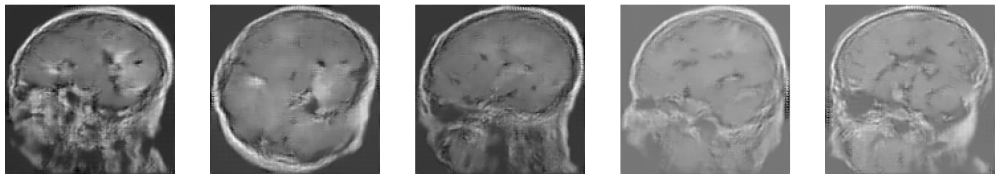

>280, 25/38, d=0.64994526, g=1.80336666
>281, 0/38, d=0.85458398, g=1.63274670
>281, 25/38, d=0.76252908, g=1.95368493
>282, 0/38, d=1.13303709, g=0.76392764
>282, 25/38, d=1.24491704, g=0.75033206
>283, 0/38, d=1.29790163, g=0.60283679
>283, 25/38, d=0.74322355, g=1.50489128
>284, 0/38, d=0.84203029, g=1.68811703
>284, 25/38, d=0.97716498, g=0.82274437
>285, 0/38, d=1.11496651, g=0.77712011
>285, 25/38, d=0.69137275, g=1.46858060
>286, 0/38, d=0.77901030, g=1.24419379
>286, 25/38, d=0.90658748, g=1.05231500
>287, 0/38, d=0.94695991, g=1.08954811
>287, 25/38, d=1.04922211, g=1.11743879
>288, 0/38, d=0.98243171, g=1.58021986
>288, 25/38, d=0.98290724, g=1.49464047
>289, 0/38, d=1.30816638, g=0.59301507
>289, 25/38, d=1.10396850, g=0.69439763
>290, 0/38, d=0.60481989, g=1.23909473
>290, 25/38, d=1.60202885, g=0.98335129
>291, 0/38, d=1.02750969, g=0.71386224
>291, 25/38, d=0.89137197, g=1.36825454
>292, 0/38, d=0.91049987, g=0.80212688
>292, 25/38, d=1.00018144, g=1.19384003
>293, 0/38, 

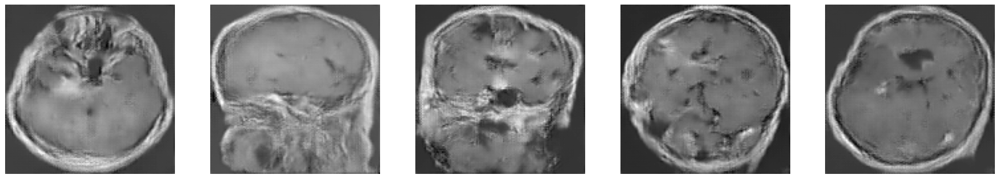

>320, 25/38, d=0.82369369, g=1.29935861
>321, 0/38, d=0.86626053, g=0.97754025
>321, 25/38, d=0.84101546, g=1.07094193
>322, 0/38, d=0.93454689, g=0.86310017
>322, 25/38, d=1.13997293, g=1.87822843
>323, 0/38, d=0.92253280, g=0.97719282
>323, 25/38, d=0.96837938, g=0.93844038
>324, 0/38, d=1.14299059, g=1.12496305
>324, 25/38, d=1.06245351, g=1.06584001
>325, 0/38, d=1.24860883, g=1.23291194
>325, 25/38, d=0.86881328, g=1.40585279
>326, 0/38, d=0.79340696, g=1.13184857
>326, 25/38, d=0.83821571, g=1.39815807
>327, 0/38, d=0.73663735, g=1.41635823
>327, 25/38, d=1.07550693, g=1.04322898
>328, 0/38, d=1.46659064, g=0.38204393
>328, 25/38, d=0.78018868, g=1.24912047
>329, 0/38, d=0.85637391, g=1.05108535
>329, 25/38, d=1.05799413, g=1.45476460
>330, 0/38, d=0.79255086, g=1.11085927
>330, 25/38, d=0.98388386, g=1.10282683
>331, 0/38, d=0.85152584, g=1.20998430
>331, 25/38, d=1.06786788, g=1.16916227
>332, 0/38, d=0.90506971, g=1.25380278
>332, 25/38, d=1.28747630, g=0.78109026
>333, 0/38, 

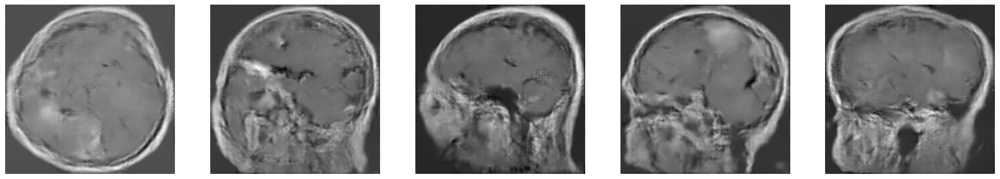

>360, 25/38, d=1.03261638, g=1.18141973
>361, 0/38, d=1.20965934, g=0.62191790
>361, 25/38, d=1.09195971, g=0.88961583
>362, 0/38, d=1.27416897, g=0.97798085
>362, 25/38, d=0.95001483, g=0.83371711
>363, 0/38, d=0.98500514, g=0.77834070
>363, 25/38, d=0.94008839, g=1.16545677
>364, 0/38, d=1.11875963, g=0.85614216
>364, 25/38, d=1.08894467, g=0.81208676
>365, 0/38, d=0.85725003, g=1.37616456
>365, 25/38, d=1.17168081, g=1.14901567
>366, 0/38, d=0.86347741, g=1.16180122
>366, 25/38, d=1.21721864, g=0.71543193
>367, 0/38, d=1.03956866, g=1.34886014
>367, 25/38, d=0.94590259, g=1.29630816
>368, 0/38, d=0.44355363, g=3.54264975
>368, 25/38, d=1.10556221, g=1.14291644
>369, 0/38, d=0.72645426, g=1.55377674
>369, 25/38, d=1.02851284, g=1.32447743
>370, 0/38, d=0.99634033, g=1.35707831
>370, 25/38, d=1.08831346, g=0.91154611
>371, 0/38, d=0.96905315, g=0.92124432
>371, 25/38, d=1.16005254, g=1.12018824
>372, 0/38, d=0.82376188, g=1.37702799
>372, 25/38, d=0.95263231, g=1.45198381
>373, 0/38, 

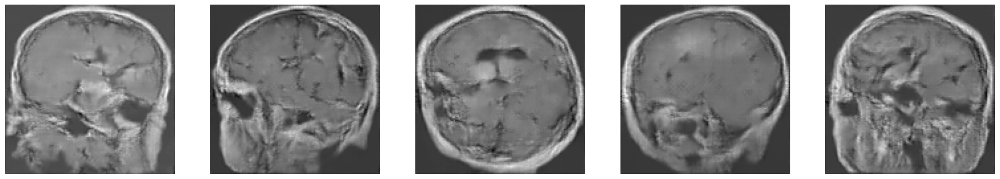

>400, 25/38, d=0.89660454, g=1.24310589
>401, 0/38, d=1.00097823, g=1.14359426
>401, 25/38, d=1.16278172, g=1.23184502
>402, 0/38, d=0.90976715, g=0.92849171
>402, 25/38, d=1.04682660, g=1.34723079
>403, 0/38, d=1.02914011, g=1.50519609
>403, 25/38, d=1.26481962, g=0.75158024
>404, 0/38, d=1.10302496, g=1.20300329
>404, 25/38, d=0.86069489, g=1.23998535
>405, 0/38, d=0.98070669, g=0.90209657
>405, 25/38, d=0.96084976, g=1.52302861
>406, 0/38, d=0.98547369, g=1.32961094
>406, 25/38, d=0.99595296, g=1.30114484
>407, 0/38, d=0.79068875, g=1.56792021
>407, 25/38, d=1.03979707, g=0.94096553
>408, 0/38, d=1.02943432, g=1.04409337
>408, 25/38, d=0.84607303, g=0.99563062
>409, 0/38, d=1.10246742, g=1.92453980
>409, 25/38, d=0.81045926, g=1.54370904
>410, 0/38, d=1.14504886, g=1.38829494
>410, 25/38, d=0.95179045, g=0.99249959
>411, 0/38, d=0.98869789, g=1.24757838
>411, 25/38, d=0.86493593, g=1.22660232
>412, 0/38, d=0.91668057, g=1.51297832
>412, 25/38, d=1.14678597, g=0.98004973
>413, 0/38, 

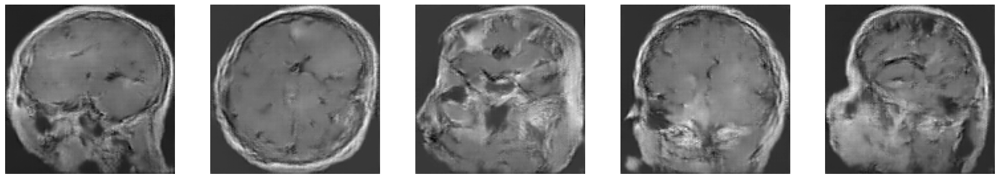

>440, 25/38, d=0.84961426, g=1.68841934
>441, 0/38, d=0.86944145, g=1.34906352
>441, 25/38, d=0.86900222, g=1.61750686
>442, 0/38, d=0.68337679, g=1.51156664
>442, 25/38, d=1.03516829, g=1.30648351
>443, 0/38, d=1.09435213, g=0.80779243
>443, 25/38, d=1.01095748, g=0.91531312
>444, 0/38, d=0.86302906, g=1.21614408
>444, 25/38, d=0.93680221, g=1.84529042
>445, 0/38, d=0.70832419, g=1.62945700
>445, 25/38, d=0.98467851, g=1.14517438
>446, 0/38, d=1.38627815, g=0.78889346
>446, 25/38, d=0.71513820, g=1.58382511
>447, 0/38, d=0.95439118, g=1.14192402
>447, 25/38, d=1.03987598, g=1.41654325
>448, 0/38, d=0.96489298, g=0.99169290
>448, 25/38, d=0.96736199, g=1.02610779
>449, 0/38, d=0.80846965, g=1.41054249
>449, 25/38, d=0.80151689, g=1.20503497
>450, 0/38, d=0.86151022, g=1.28868127
>450, 25/38, d=1.04271817, g=1.08983028
>451, 0/38, d=1.24435306, g=0.93343931
>451, 25/38, d=1.09722781, g=0.95060652
>452, 0/38, d=1.38889146, g=0.92883945
>452, 25/38, d=0.85792589, g=2.23949814
>453, 0/38, 

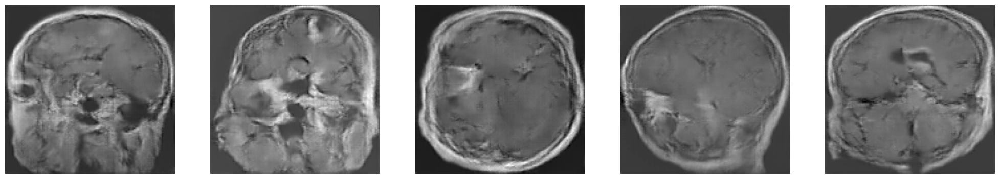

>480, 25/38, d=0.79165828, g=1.68155587
>481, 0/38, d=0.99910235, g=0.97967792
>481, 25/38, d=0.95688927, g=1.02414429
>482, 0/38, d=0.90470803, g=1.52719820
>482, 25/38, d=0.91616297, g=0.98144674
>483, 0/38, d=0.95689875, g=1.36266208
>483, 25/38, d=1.15760231, g=0.86510557
>484, 0/38, d=0.98404425, g=1.24744630
>484, 25/38, d=1.00562739, g=1.45094490
>485, 0/38, d=1.15234792, g=1.23995674
>485, 25/38, d=0.68885422, g=1.35166180
>486, 0/38, d=0.90187991, g=1.43975031
>486, 25/38, d=1.02792275, g=0.67972237
>487, 0/38, d=1.01586962, g=1.37742257
>487, 25/38, d=1.14858699, g=0.74149185
>488, 0/38, d=1.04551291, g=1.16793406
>488, 25/38, d=0.84417111, g=1.56654310
>489, 0/38, d=0.93440175, g=1.32431805
>489, 25/38, d=0.71392930, g=1.49195826
>490, 0/38, d=1.42060637, g=0.56925464
>490, 25/38, d=1.01106822, g=1.00078559
>491, 0/38, d=0.96478999, g=1.28455591
>491, 25/38, d=0.81317091, g=1.31479502
>492, 0/38, d=1.07954907, g=1.80466485
>492, 25/38, d=1.01801324, g=1.34786487
>493, 0/38, 

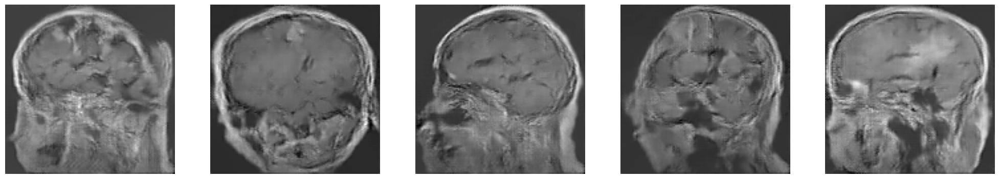

>520, 25/38, d=0.87340498, g=1.29975927
>521, 0/38, d=0.66959095, g=1.21358323
>521, 25/38, d=1.19357765, g=1.95310521
>522, 0/38, d=0.79898894, g=1.54204237
>522, 25/38, d=0.99729085, g=1.06670535
>523, 0/38, d=0.93420422, g=1.59956181
>523, 25/38, d=0.76165748, g=1.40915394
>524, 0/38, d=1.21746159, g=1.68493819
>524, 25/38, d=1.00962400, g=1.45203948
>525, 0/38, d=1.05360627, g=1.64602757
>525, 25/38, d=0.81688285, g=1.46014750
>526, 0/38, d=0.85830009, g=1.08996701
>526, 25/38, d=0.96717703, g=0.94662023
>527, 0/38, d=0.69491386, g=1.80029988
>527, 25/38, d=0.79811078, g=1.45379877
>528, 0/38, d=0.77440727, g=1.06697381
>528, 25/38, d=0.53942680, g=1.83827317
>529, 0/38, d=0.53594112, g=2.30883217
>529, 25/38, d=1.11438084, g=0.80074829
>530, 0/38, d=0.93641090, g=0.80124712
>530, 25/38, d=0.63196635, g=1.80667698
>531, 0/38, d=0.85322201, g=1.20577347
>531, 25/38, d=0.85596871, g=1.97083354
>532, 0/38, d=0.60889250, g=1.31277323
>532, 25/38, d=0.56243783, g=1.49697959
>533, 0/38, 

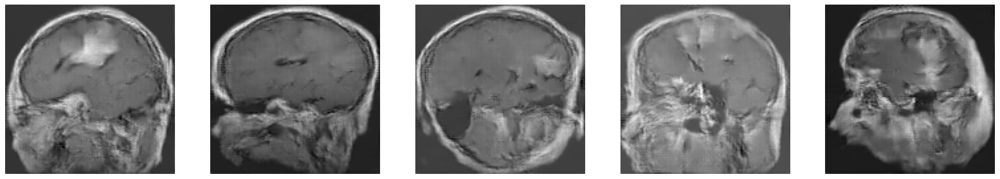

>560, 25/38, d=0.79312211, g=3.35836458
>561, 0/38, d=1.03659129, g=1.05620801
>561, 25/38, d=1.20986855, g=2.23225307
>562, 0/38, d=0.87512684, g=1.59101343
>562, 25/38, d=0.91161472, g=1.13120270
>563, 0/38, d=0.75623202, g=1.46931791
>563, 25/38, d=0.93071306, g=2.07682037
>564, 0/38, d=1.10299420, g=1.14659667
>564, 25/38, d=0.66413033, g=1.79433370
>565, 0/38, d=1.22583199, g=1.72465396
>565, 25/38, d=0.81525046, g=1.10338712
>566, 0/38, d=1.24212086, g=1.46554327
>566, 25/38, d=0.66312671, g=1.81978774
>567, 0/38, d=1.09010327, g=1.26974499
>567, 25/38, d=0.69210702, g=1.86485100
>568, 0/38, d=0.80213046, g=1.29391313
>568, 25/38, d=0.79356366, g=1.71838748
>569, 0/38, d=0.87570232, g=1.33554792
>569, 25/38, d=1.00854874, g=1.11632729
>570, 0/38, d=1.04410911, g=1.16852903
>570, 25/38, d=1.07472396, g=1.06324613
>571, 0/38, d=0.88430774, g=1.20613074
>571, 25/38, d=0.66960287, g=1.29188251
>572, 0/38, d=1.08997774, g=1.55848312
>572, 25/38, d=0.78068054, g=0.99907023
>573, 0/38, 

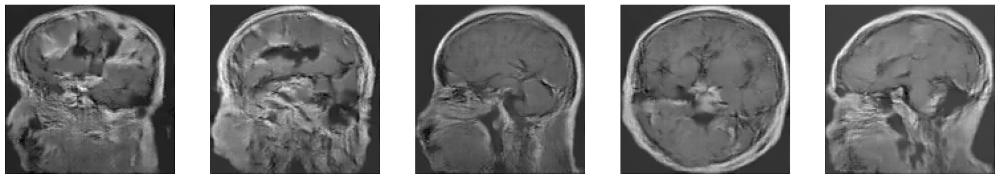

>600, 25/38, d=0.58709604, g=1.58824706
>601, 0/38, d=0.91292632, g=1.46582508
>601, 25/38, d=0.82319856, g=1.64822209
>602, 0/38, d=0.92225266, g=1.82699728
>602, 25/38, d=0.60265410, g=1.72898996
>603, 0/38, d=1.01675558, g=1.60114026
>603, 25/38, d=0.75944555, g=1.63958931
>604, 0/38, d=0.78409845, g=1.83668637
>604, 25/38, d=0.54686451, g=1.65985847
>605, 0/38, d=0.89119869, g=1.49439585
>605, 25/38, d=1.11172700, g=1.33132243
>606, 0/38, d=0.98889172, g=1.01301837
>606, 25/38, d=0.62992489, g=2.57401276
>607, 0/38, d=0.49462408, g=2.23547649
>607, 25/38, d=0.77502799, g=1.46509492
>608, 0/38, d=1.08880973, g=1.35615993
>608, 25/38, d=0.90609622, g=1.44606793
>609, 0/38, d=0.76175392, g=1.23220801
>609, 25/38, d=1.15228915, g=1.14216304
>610, 0/38, d=0.79099947, g=1.39070606
>610, 25/38, d=0.66841555, g=1.61662042
>611, 0/38, d=0.97543693, g=1.10083532
>611, 25/38, d=0.85812747, g=2.02957678
>612, 0/38, d=0.91763449, g=1.07751620
>612, 25/38, d=1.10709262, g=1.11867630
>613, 0/38, 

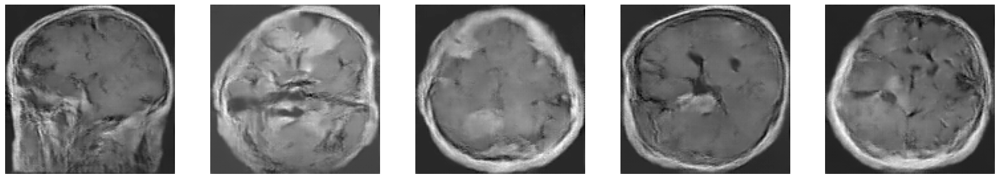

>640, 25/38, d=0.75091422, g=1.80173373
>641, 0/38, d=0.83991861, g=1.25004900
>641, 25/38, d=0.70905632, g=1.95116913
>642, 0/38, d=0.68675977, g=1.42531347
>642, 25/38, d=0.78448725, g=1.76651680
>643, 0/38, d=0.79138845, g=1.92545652
>643, 25/38, d=0.84744132, g=1.34092593
>644, 0/38, d=0.78546280, g=1.99915540
>644, 25/38, d=0.83267748, g=1.73068571
>645, 0/38, d=0.82551014, g=1.31141984
>645, 25/38, d=1.13301206, g=1.00733709
>646, 0/38, d=0.79324400, g=2.88504720
>646, 25/38, d=1.04480457, g=1.76855671
>647, 0/38, d=0.99865842, g=1.67999220
>647, 25/38, d=0.72214723, g=1.81155205
>648, 0/38, d=0.65865403, g=1.43787980
>648, 25/38, d=1.04034734, g=1.56097388
>649, 0/38, d=0.90701807, g=1.50543070
>649, 25/38, d=0.99547452, g=1.23751402
>650, 0/38, d=0.71061802, g=1.72992802
>650, 25/38, d=0.82460546, g=1.68861437
>651, 0/38, d=0.88680941, g=1.97332823
>651, 25/38, d=0.84057957, g=1.47733855
>652, 0/38, d=0.84196258, g=1.32790565
>652, 25/38, d=0.72620893, g=1.63085198
>653, 0/38, 

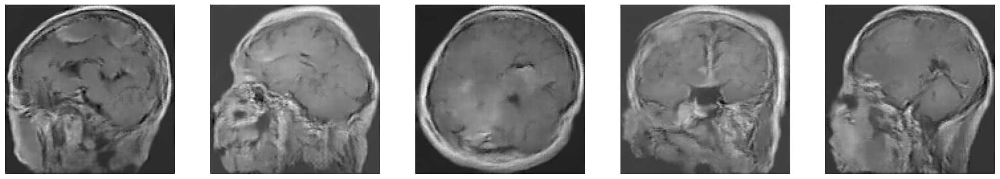

>680, 25/38, d=0.87724006, g=1.79951501
>681, 0/38, d=0.70944226, g=1.90343916
>681, 25/38, d=0.66238731, g=1.26247907
>682, 0/38, d=0.85080826, g=1.01473212
>682, 25/38, d=0.73505175, g=1.23810887
>683, 0/38, d=0.64743197, g=2.29767132
>683, 25/38, d=0.79358995, g=1.46861815
>684, 0/38, d=0.72423398, g=1.69819176
>684, 25/38, d=0.85886550, g=1.75816345
>685, 0/38, d=0.80470943, g=1.58969307
>685, 25/38, d=0.98194414, g=1.41462719
>686, 0/38, d=0.89927733, g=1.26548040
>686, 25/38, d=0.75147259, g=1.92776406
>687, 0/38, d=1.01274621, g=1.23245168
>687, 25/38, d=0.78086090, g=1.42346013
>688, 0/38, d=0.74455696, g=1.86305594
>688, 25/38, d=0.90297127, g=1.40550160
>689, 0/38, d=0.92184162, g=1.70175374
>689, 25/38, d=0.78914070, g=1.19162345
>690, 0/38, d=0.46711811, g=1.58035576
>690, 25/38, d=0.69333506, g=1.55443084
>691, 0/38, d=0.70776534, g=1.31978750
>691, 25/38, d=0.79649794, g=1.34179759
>692, 0/38, d=0.77153230, g=1.77888536
>692, 25/38, d=0.57883400, g=1.79574776
>693, 0/38, 

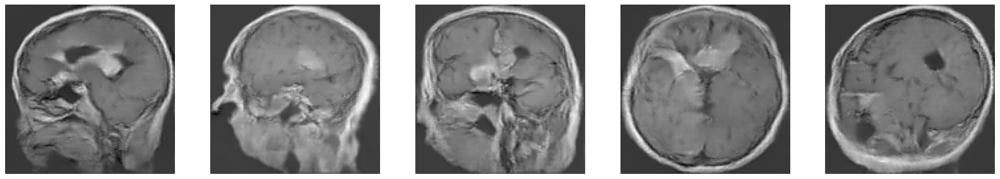

>760, 25/38, d=0.96325797, g=1.06135869
>761, 0/38, d=0.69119084, g=1.89334083
>761, 25/38, d=0.58332634, g=1.54080224
>762, 0/38, d=0.83391273, g=1.64133680
>762, 25/38, d=1.05397701, g=2.41635418
>763, 0/38, d=0.75379133, g=2.43930221
>763, 25/38, d=0.80014694, g=1.72179937
>764, 0/38, d=1.01455581, g=1.17763615
>764, 25/38, d=0.54618001, g=2.17524719
>765, 0/38, d=0.94137168, g=1.17825055
>765, 25/38, d=0.70556182, g=1.28905833
>766, 0/38, d=0.72626519, g=1.28495824
>766, 25/38, d=0.90862894, g=1.16707349
>767, 0/38, d=0.69151545, g=1.67647243
>767, 25/38, d=0.78400755, g=1.81222165
>768, 0/38, d=0.88923645, g=2.52866650
>768, 25/38, d=0.51198560, g=2.48869371
>769, 0/38, d=0.78767884, g=2.81925106
>769, 25/38, d=0.54276252, g=1.90026593
>770, 0/38, d=0.52473944, g=1.86272287
>770, 25/38, d=0.77037930, g=1.45898473
>771, 0/38, d=0.86123776, g=2.05516934
>771, 25/38, d=0.93518364, g=2.18045425
>772, 0/38, d=1.06616449, g=1.50827658
>772, 25/38, d=0.99591446, g=1.08842254
>773, 0/38, 

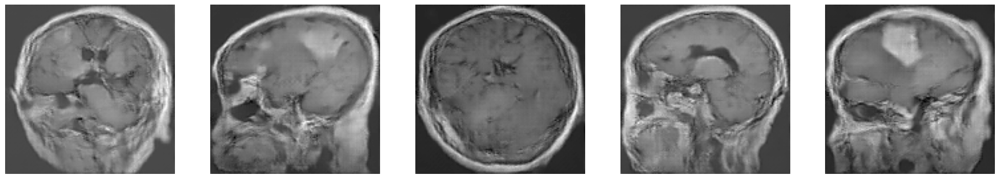

>800, 25/38, d=0.57620656, g=2.44855642
>801, 0/38, d=0.98645395, g=1.85049307
>801, 25/38, d=0.42972061, g=1.86371017
>802, 0/38, d=0.94925493, g=1.35087132
>802, 25/38, d=0.67153013, g=2.21094751
>803, 0/38, d=0.73054624, g=1.26911139
>803, 25/38, d=0.63332915, g=1.54607916
>804, 0/38, d=0.63251269, g=2.15279007
>804, 25/38, d=0.89016205, g=1.23776913
>805, 0/38, d=0.55795389, g=2.13532805
>805, 25/38, d=0.67044264, g=1.91777432
>806, 0/38, d=0.89331245, g=1.58328032
>806, 25/38, d=1.09345114, g=0.98507190
>807, 0/38, d=1.12427998, g=1.94020534
>807, 25/38, d=0.93300086, g=1.58537054
>808, 0/38, d=0.46814495, g=2.17928290
>808, 25/38, d=0.97192729, g=1.35531247
>809, 0/38, d=1.08776069, g=1.25639343
>809, 25/38, d=0.67423451, g=1.75991178
>810, 0/38, d=0.54729891, g=2.04688644
>810, 25/38, d=0.52970266, g=1.71465135
>811, 0/38, d=0.63833779, g=1.91947532
>811, 25/38, d=0.92145854, g=1.30481076
>812, 0/38, d=0.68973267, g=2.04251051
>812, 25/38, d=0.75492895, g=1.54270291
>813, 0/38, 

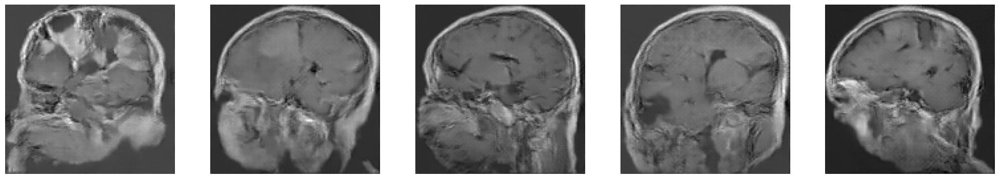

>840, 25/38, d=0.63512421, g=1.44323099
>841, 0/38, d=0.84573746, g=1.24810362
>841, 25/38, d=0.71086562, g=2.27506113
>842, 0/38, d=0.91172558, g=2.75694871
>842, 25/38, d=0.99007034, g=1.45438099
>843, 0/38, d=0.94932687, g=2.56609488
>843, 25/38, d=1.16068459, g=0.88775164
>844, 0/38, d=0.67075294, g=2.68136358
>844, 25/38, d=0.58741963, g=2.26579046
>845, 0/38, d=0.60688740, g=2.31008697
>845, 25/38, d=0.72667873, g=1.32278228
>846, 0/38, d=0.56628382, g=1.50243473
>846, 25/38, d=0.63906169, g=2.58065462
>847, 0/38, d=0.61207169, g=1.57544136
>847, 25/38, d=0.56133658, g=2.11200142
>848, 0/38, d=0.78120452, g=1.92410052
>848, 25/38, d=1.15566754, g=1.38211024
>849, 0/38, d=1.05675483, g=1.40608454
>849, 25/38, d=0.71766746, g=1.86621118
>850, 0/38, d=1.26581180, g=2.91447020
>850, 25/38, d=0.70018309, g=2.14251900
>851, 0/38, d=0.60769767, g=2.09811854
>851, 25/38, d=0.61174548, g=1.93513906
>852, 0/38, d=0.68832713, g=1.81753612
>852, 25/38, d=0.79560518, g=1.89449942
>853, 0/38, 

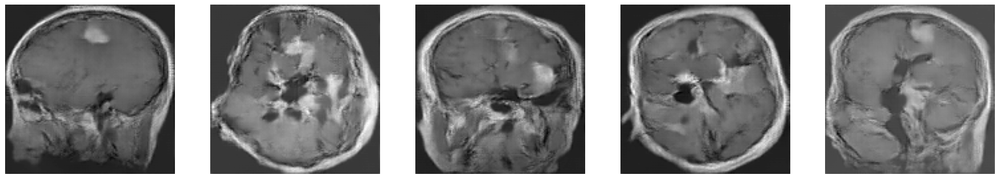

>880, 25/38, d=0.78121066, g=2.20498133
>881, 0/38, d=0.94624197, g=1.59200525
>881, 25/38, d=0.54138583, g=1.80626452
>882, 0/38, d=0.72367227, g=2.32525921
>882, 25/38, d=0.97668678, g=1.45966983
>883, 0/38, d=0.46740913, g=2.85339069
>883, 25/38, d=0.58359396, g=1.98308730
>884, 0/38, d=0.73435092, g=2.15551782
>884, 25/38, d=0.86454540, g=1.38791656
>885, 0/38, d=1.16954517, g=2.85986900
>885, 25/38, d=0.70710933, g=3.06249237
>886, 0/38, d=0.92437011, g=1.66485608
>886, 25/38, d=0.84287119, g=2.68511820
>887, 0/38, d=0.64539969, g=1.51228738
>887, 25/38, d=0.77468407, g=1.24010062
>888, 0/38, d=0.96159613, g=1.63587427
>888, 25/38, d=0.43990234, g=2.11377406
>889, 0/38, d=0.69107866, g=1.51912427
>889, 25/38, d=1.14166665, g=1.16676915
>890, 0/38, d=0.60798836, g=1.42016840
>890, 25/38, d=1.00127089, g=1.48031712
>891, 0/38, d=0.75386226, g=1.58193982
>891, 25/38, d=0.89066994, g=3.23052597
>892, 0/38, d=0.66473985, g=1.60242343
>892, 25/38, d=0.98138922, g=1.29078019
>893, 0/38, 

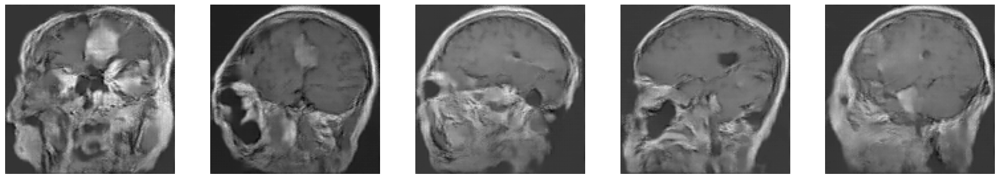

>920, 25/38, d=0.71797562, g=1.96034145
>921, 0/38, d=0.52471870, g=1.70858860
>921, 25/38, d=0.70780694, g=2.09133482
>922, 0/38, d=0.72260833, g=1.58809948
>922, 25/38, d=0.88407028, g=1.41512048
>923, 0/38, d=0.72360659, g=1.59247041
>923, 25/38, d=0.49977085, g=1.90243173
>924, 0/38, d=0.83480477, g=1.41744959
>924, 25/38, d=0.84299320, g=1.80350280
>925, 0/38, d=1.00621009, g=2.41383505
>925, 25/38, d=0.71720165, g=2.19019413
>926, 0/38, d=0.75651288, g=1.89664972
>926, 25/38, d=0.90430504, g=1.42295933
>927, 0/38, d=0.64590180, g=2.61278629
>927, 25/38, d=0.58214766, g=2.22605658
>928, 0/38, d=0.61086738, g=2.40277243
>928, 25/38, d=0.52262294, g=2.80804729
>929, 0/38, d=0.43801937, g=2.48605394
>929, 25/38, d=0.50261259, g=2.27790642
>930, 0/38, d=0.76736546, g=1.84130681
>930, 25/38, d=0.65202272, g=2.00368738
>931, 0/38, d=0.55708933, g=2.62662768
>931, 25/38, d=1.04987872, g=1.22331035
>932, 0/38, d=0.74365652, g=1.38211823
>932, 25/38, d=0.61912763, g=1.89527035
>933, 0/38, 

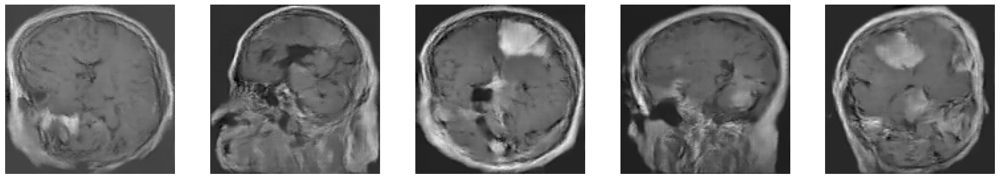

>960, 25/38, d=0.53857815, g=1.58570576
>961, 0/38, d=0.62299407, g=2.03836870
>961, 25/38, d=0.59963971, g=2.55456328
>962, 0/38, d=0.64908874, g=2.05850911
>962, 25/38, d=0.60427511, g=2.17506123
>963, 0/38, d=0.54736185, g=1.86392903
>963, 25/38, d=0.91184837, g=1.67331588
>964, 0/38, d=0.61148471, g=2.58014607
>964, 25/38, d=0.59302819, g=2.06221008
>965, 0/38, d=1.08676624, g=1.98098457
>965, 25/38, d=0.79147387, g=2.28873825
>966, 0/38, d=0.62026280, g=2.27049804
>966, 25/38, d=0.49978542, g=2.18949318
>967, 0/38, d=0.73647636, g=1.65531933
>967, 25/38, d=0.82197833, g=1.79914546
>968, 0/38, d=0.59590429, g=2.35447168
>968, 25/38, d=0.80022192, g=1.81578612
>969, 0/38, d=0.92486835, g=1.71908498
>969, 25/38, d=0.89476502, g=1.43028629
>970, 0/38, d=0.86178905, g=1.26338315
>970, 25/38, d=0.92370975, g=1.59797168
>971, 0/38, d=0.67697579, g=2.00082660
>971, 25/38, d=0.85791779, g=2.04488134
>972, 0/38, d=1.14081240, g=1.08163416
>972, 25/38, d=0.99732500, g=2.00467491
>973, 0/38, 

In [18]:
d_hist, g_hist = train(train_dataset, EPOCHS)

In [19]:
from matplotlib import pyplot as plt
def plot_learning_curve(d_loss_lst, gan_loss_lst):
  fig = plt.figure()
  plt.plot(d_loss_lst, color='skyblue')
  plt.plot(gan_loss_lst, color='gold')
  plt.title('Model Learning Curve')
  plt.xlabel('Epochs'); plt.ylabel('Cross Entropy Loss')
  plt.show()

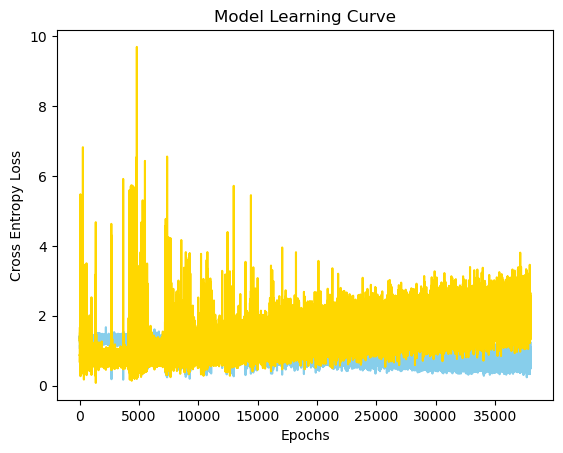

In [20]:
plot_learning_curve(d_hist, g_hist)

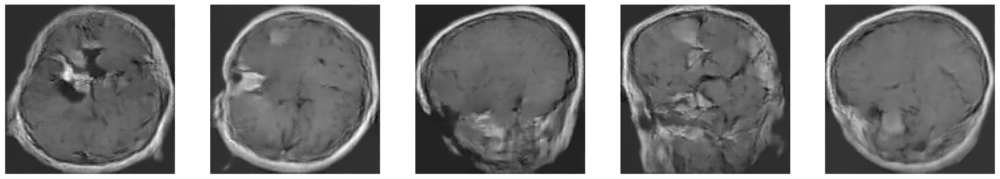

In [21]:
#######look at generator images########
n_samples=5
noise = tf.random.normal([n_samples, latent_dim])
x_fake = g_model(noise,training=False)

pyplot.figure(figsize=(25,25))
for i in range(n_samples):
    # define subplot
    pyplot.subplot(5, 5, 1 + i)
    pyplot.axis('off')
    # plot single image
    pyplot.imshow(x_fake[i, :, :,0],cmap='gray')
pyplot.show()
pyplot.close()

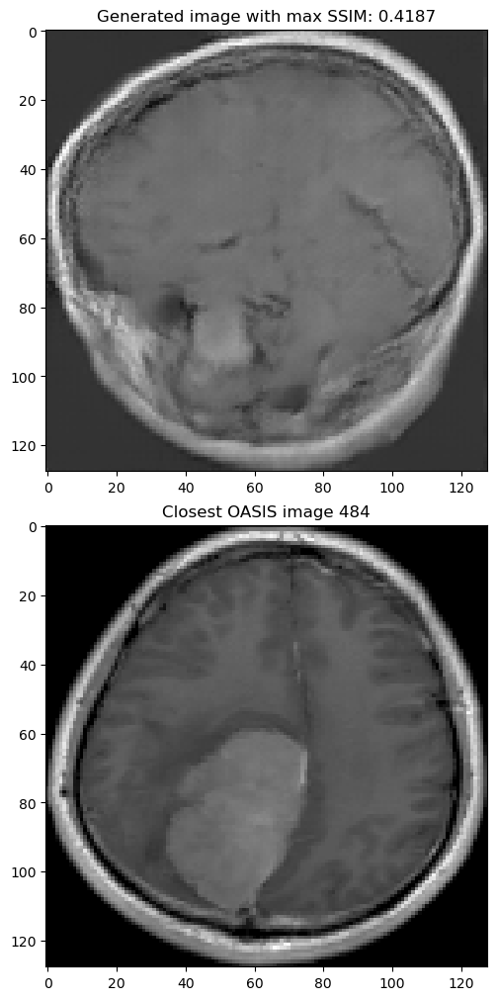

In [23]:
#since calculating SSIM for one image is computationally expensive, just choose the index of one image to calculate
#whichfake is the index of the sample image
whichfake=4

#create array to store SSIM values
ssim_noise=[]

#calculate SSIM for each training image
for i in range(images.shape[0]):
    ssim_noise.append( ssim(images[i,:,:,0], x_fake.numpy()[whichfake,:,:,0], 
                      data_range=np.max(x_fake.numpy()[whichfake,:,:,0]) - np.min(x_fake.numpy()[whichfake,:,:,0])))

#plot generated image and OASIS image that corresponds to the highest SSIM value
fig, axs = pyplot.subplots(2, 1, constrained_layout=True,figsize=(10,10))
axs[0].imshow(x_fake[whichfake, :, :, 0],cmap="gray")
axs[0].set_title('Generated image with max SSIM: {:.4f}'.format(np.max(ssim_noise)))

axs[1].imshow(images[ssim_noise.index(np.max(ssim_noise)), :, :, 0],cmap="gray")
axs[1].set_title('Closest OASIS image {:.0f}'.format(ssim_noise.index(np.max(ssim_noise))))

pyplot.show()